<a href="https://colab.research.google.com/github/Ahmednyc1/dog-imgage/blob/main/end_to_end_dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End to end Milti-class Dog Breed Claaification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given the image of a dog.

when I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is

## 2. Data

The data we're using is from Kaggle's dog breeed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data


##3. Evaluation

The evaluaiton is a file with. prediction probabilities for each dog breed for each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation


## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so its probably best we use deep learning/transfer learning.

* There area 120 breeds of dogs(this means there are 120 different classes) .
* There are around 10,000+ images in the training set
(these images have labels)
* There are around 10,000+ images in the test set (these images have no labels , because we'll want to predict them).

In [ ]:
#unzip the uplodaed data into google drive
#!unzip "/content/drive/MyDrive/dog vision/dog-breed-identification.zip" -d 'drive/My Drive/dog vision/'


### Get our workspace ready

* Import TensorFlow 2.15
* Import TensorFlow Hub
* Make sure we're using a GPU



In [ ]:
# Import necassary tools
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import numpy as np
from IPython.display import Image
import os
from sklearn.model_selection import train_test_split
from matplotlib.pyplot import imread
import matplotlib.pyplot as plt
%load_ext tensorboard
import datetime
print('TF version:',tf.__version__)
print('TF Hub version:',hub.__version__)

# Check for GPU availability
print('GPU','available (YES!!!!)' if tf.config.list_physical_devices('GPU') else 'not available :(')

TF version: 2.15.0
TF Hub version: 0.16.1
GPU available (YES!!!!)


## Getting our data ready , (turning it into Tensors)

With all machine learning models, our data has to be in numerical format. so that's what we'll be doing first.Turning our images into Tensors(numerical representation).

Let's start by accessing our data and checking out the labels

In [ ]:
# Checkout the labels of our data

labels_csv=pd.read_csv('drive/My Drive/dog vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

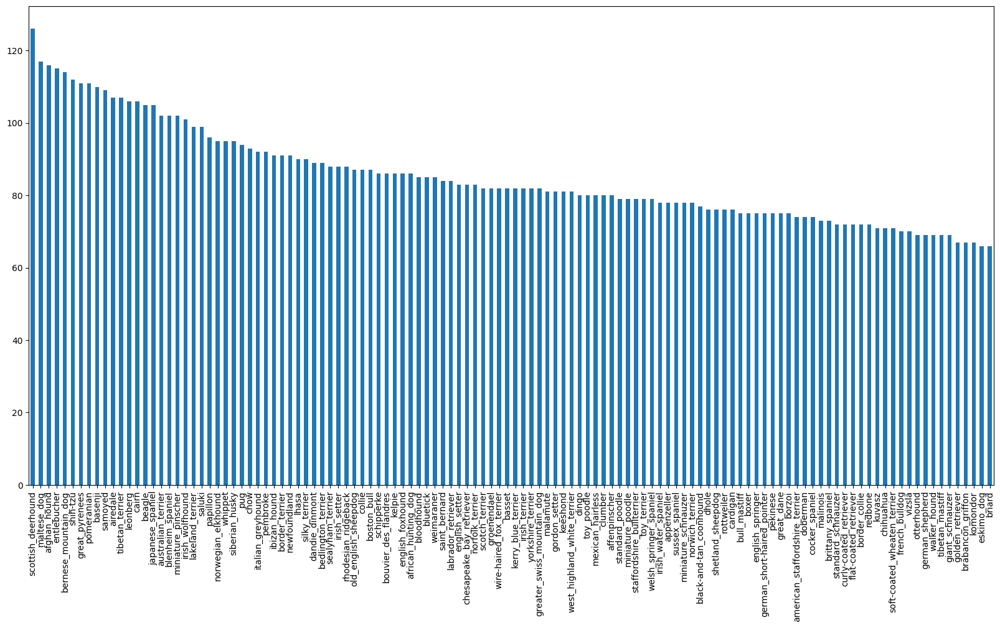

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().mean()

85.18333333333334

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

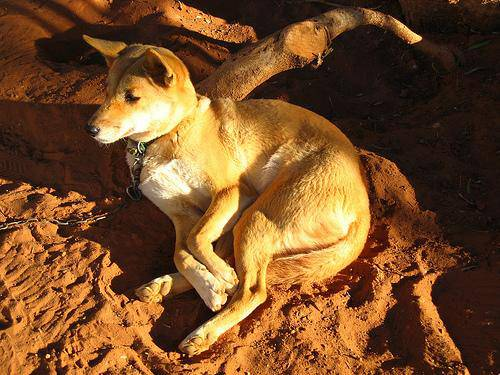

In [ ]:
#Lets view an image
Image('drive/My Drive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

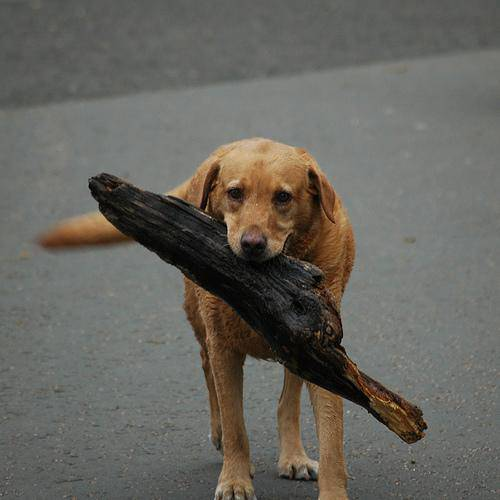

In [ ]:
Image('drive/My Drive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg')

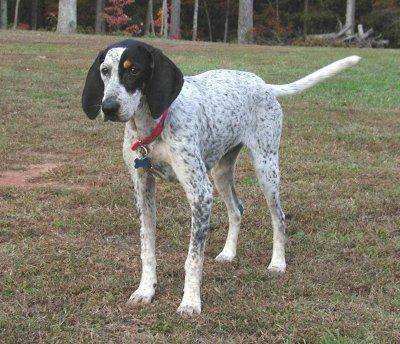

In [ ]:
Image('drive/My Drive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg')

### Getting images and their labels

Let's get a list of all of our image file pathnames.


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames for image Id's
filenames=["drive/My Drive/dog vision/train/" +fname + '.jpg'for fname in labels_csv['id']]

filenames[:10]

['drive/My Drive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check wheather number of filenames matches number of actualy image files
if len(os.listdir('drive/My Drive/dog vision/train/'))== len(filenames):
  print('Filesnames match actual amount of files!!! Proceed.')
else:
  print('Filenames do not match actual amount of files, check the target directory.')



Filesnames match actual amount of files!!! Proceed.


In [ ]:
os.listdir('drive/My Drive/dog vision/train')

['e54ed50db3e1079db9284bd30494de76.jpg',
 'e4a159a9611f2025cecf53bf8e09699b.jpg',
 'e2e46a91de179a79ab3b0ec7f813df27.jpg',
 'e4f4ecefab54cba3356b0c8bf7ce4fee.jpg',
 'e278e285726d3ec4b737d80cc891d266.jpg',
 'e63afe537a7d02e36846ca681e89f198.jpg',
 'dee927ec2ed2efb5ea8bda227d0be2b5.jpg',
 'e77a27e8f24034facbfae4b2dffd476b.jpg',
 'e30db8f52d5fe88e128697d8fbd163e9.jpg',
 'e03cdc6533bf441f8bdb7467b1039996.jpg',
 'e2b2636c291ebf5649ba403b9592f51e.jpg',
 'e4ca855e09eabf518ed39a0a545da981.jpg',
 'e552addd2461f8a62e9691fa26b21370.jpg',
 'e08af1f586d3150e4cecb3c42668b0e0.jpg',
 'dbf58e6de2a26b9f6f26c1c8723af964.jpg',
 'e1af6b48fbc089b3704ee26ade7b4f6c.jpg',
 'e92c996c9454434af5a9e702076338dc.jpg',
 'e8489d90981775781ccff2f27f7f413a.jpg',
 'df08c075e337bb17c6dd66096f3dff4f.jpg',
 'e5c20fbe4702370b3dc2690bb72a8cd7.jpg',
 'e51781dd757f5355fdf5f0b5872b6ae1.jpg',
 'e1b04d497388246d0305c01f8d01fa1a.jpg',
 'e1d53fa88060cde37192028ee3ca4629.jpg',
 'e5831fcb399c887cb0ac1e3a3d229f7b.jpg',
 'e212cce60c302d

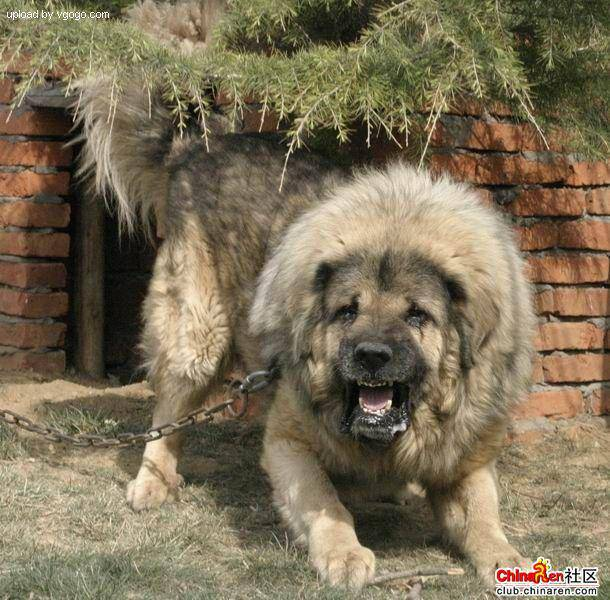

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
#We are going to first put our labels in a np.array
labels=labels_csv['breed'].to_numpy()
#labels=np.array(labels) #does same thing as
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check if numbers of labels matches number of filenames(to check if theres any missing unstructured data)
if len(labels)==len(filenames):
  print('Number of labels matches number of filenames!')
else:
  print('Number of labels does not match number of filenames!,check data directorys')


Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds =np.unique(labels)
len(unique_breeds)

120

In [ ]:
#  Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn everylabel into a boolean array
boolean_labels=[label==unique_breeds for label in labels]
len(boolean_labels)

10222

In [ ]:
# Example:Turning into boolean arrary into integers

print(labels[0]) #original label
print(np.where(unique_breeds==labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set,we're going to create our own

In [ ]:
# Setup X and 7 variables
X=filenames
y=boolean_labels

In [ ]:
print(len(filenames)==len(X))

True


We're going to start off experimenting with about 1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES= 1000 #@param{type:'slider',min:1000,max:10000,step:100}

In [ ]:
#Let's split our data into train and validation

#Split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=32)

len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a look at the training data
X_train[:2],y_train[:2]

(['drive/My Drive/dog vision/train/13cab1309bdaf21aa17cf71fd6f88a65.jpg',
  'drive/My Drive/dog vision/train/0b3d3120a62c2bc280f589d473041d06.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, F

### Preprocessing Images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable.`image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image(convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like

In [ ]:
# Convert image to Numpy

image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2]
#A gpu would find patterns in this alot of faster then a cpu

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:



#Define image size
IMG_SIZE=224
# Create a function for preprocessing images
def process_image(image_path,img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  #Read in an image  file
  image=tf.io.read_file(image_path)
  #Turing our image into numerical Tensor with 3 colour channels (Red,Green,Blue)
  image=tf.image.decode_jpeg(image,channels=3)
  #Convert the colour channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to our desired value (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  #return the image
  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So thats why we do about 32 (this is the batch size) images at a time( you can manually adjust the batch size if need be).

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:
`(image ,label)`
we pass 32 of these at a time in our machine learning model loop by loop

In [ ]:
# Create a simple to return a tuple(image label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a tuple of (image,label).
  """
  image=process_image(image_path)
  return image,label

In [ ]:
#Demo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form:`(image,label)`, let's make a function to turn all of our data(`X` &`y`) into batches!

In [ ]:
# Define the batch size ,32 is a good start
BATCH_SIZE=32
#Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Create batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels).
    """
    # If the data is a test dataset, we definitely don't have labels
    if test_data:
        print('Creating test data batches...')
        data = tf.data.Dataset.from_tensor_slices(tf.constant(X))  # only filepaths (no labels)
        data_batch = data.map(process_image).batch(batch_size)
        return data_batch

    # If the data is a valid dataset, we don't need to shuffle it
    elif valid_data:
        print('Creating validation data batches...')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                                   tf.constant(y)))  # labels
        data_batch = data.map(get_image_label).batch(batch_size)
        return data_batch

    else:
        print('Creating training data batches...')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                                   tf.constant(y)))  # labels
    # Shuffling the pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(batch_size)

    return data_batch


In [ ]:
# Create training  and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
#Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

### Visualizing Data Batches

Our data is now in batches, however , these can be a little hard to understand/
comprehend, let's visualize them

In [ ]:
#Create a function for viewing images in  a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch/
  """
  plt.figure(figsize=(10,10))
  #Loop through 25(for displaying 25 images)
  for i in range(25):
    #Create subplots (5 rows ,5 columns)
    ax=plt.subplot(5,5,i+1) #rows,columns,index
    #Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis('off')

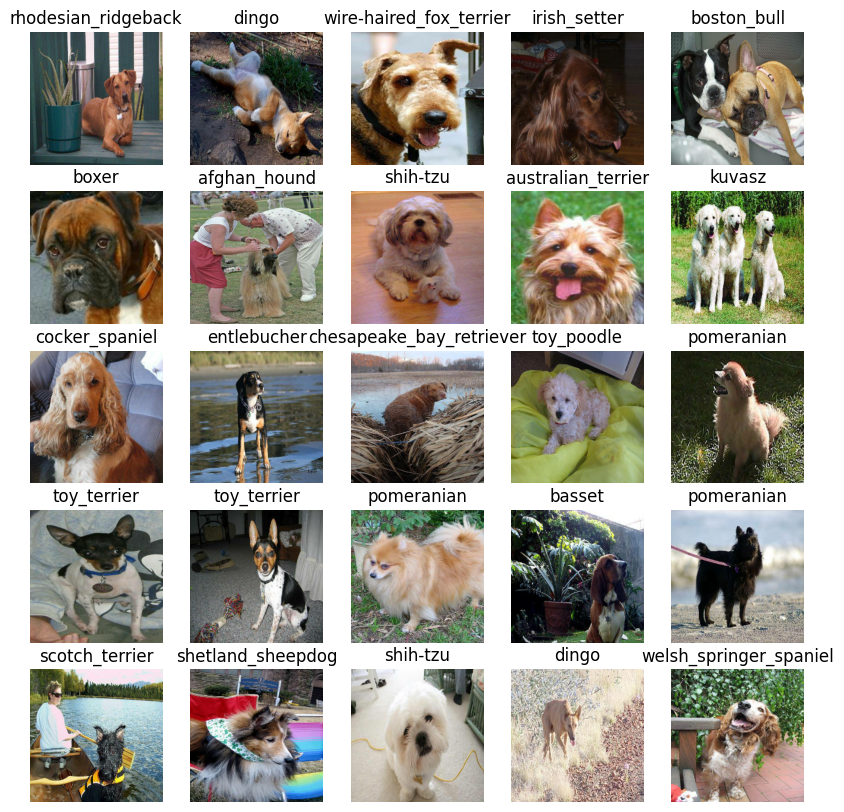

In [ ]:
# Now let's our visualize the data in a training batch
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

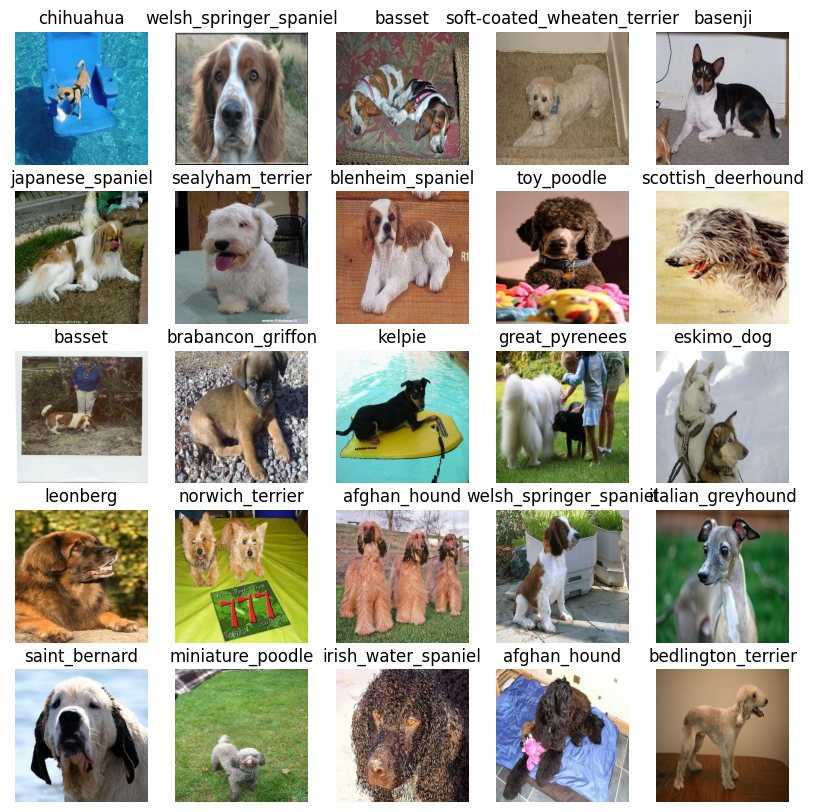

In [ ]:
#now lets visualize the validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model ,there are a few things we need to define:
* The input shape( our images shape ,in the form of Tensors) to our model.
* The output shape (image, labels , in the form of Tensors) of our model.
* The URL of the model we want to use.(Transfer Learning)
*

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] #BATCH,HEIGHT,WIDTH,colour channels

#setup output shape of our mdoel

OUTPUT_SHAPE=len(unique_breeds)

#Setup model URL from Tensorflow HUB
MODEL_URL= "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

Now we've got our inputs ,outputs and model ready to go. Let's put them together into a Keras deep learning model!
Knowing this, let's create. a function which:
* Takes the input shape,output shape and the model we've chose as parameters
* Defines the layers in a Keras model in sequential fashion
(do this first, then this ,then that)
* Compiles the model (says it should be evaluated and improved).
* Builds the model(tells the model the input shape it'll be getting).
* Returns the model

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print('Building model with:',MODEL_URL)

  #setup the model layers
  model=tf.keras.Sequential([
  hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
  tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                      activation='softmax'),#Layer 2 output later

  ])

  #Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(),
                 metrics=['accuracy'])
  #Build the model
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model =create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs =np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

In [ ]:
len(unique_breeds)

120

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks , one for Tensorboard which helps track our models progress and another for early stopping which prevents our model from training for too long so it doesnt overfit

### TensorBoard Callback

To setup a Tensorboard Callback we need to do 3 thing s
1.Loard the Tensorboard notebook extension
2. Create a Tensorboard callback which is able to save logs to a directory and pass it tour model's `fit()` function.
3. Visualize our model training logs with the `%tensorboard` magic function (we'll do this after model training )


In [ ]:
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard logs
  logdir=os.path.join("drive/ My Drive/dog vision/logs",
                       # Make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps stop our model from overfiting by stopping training if a certain evaluation metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping =tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3)

### Training a model (on subset of data)

Our first model is only going to train on 1000 images to make sure everything is working

In [ ]:
NUM_EPOCHS=100  #@param {type:'slider',min:10,max:100,step:10}

In [ ]:
# Check to make sure we'll stil running on a GPU

print('GPU','available (Yes!!!)' if tf.config.list_physical_devices('GPU')else 'not avaliable')

GPU available (Yes!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setuput a TensorBoard callback using `create_tensorboard_callback()`

* Call the `fit()` function on our model passing it the training data,validation data , number of epochs to train for ('NUM_EPOCHS') and the call backs wed like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model

def train_model():
  """
  Trains a given mdoel and returns the trained version .
  """
  # Create a model
  model=create_model()
  #Create a new TensorBoard session everytimg we train a model
  tensorboard=create_tensorboard_callback()
  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  #Return the FITTED model
  return model

In [ ]:
model=train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1


NameError: name 'NUM_EPOCHS' is not defined

** Question**: It looks like our model is overfitting because its performing far better on the training dataset that the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

** Note: ** Overfitting to begin with is a good thing , it means our model is learning !!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/dog\ vision/logs

Reusing TensorBoard on port 6006 (pid 10304), started 1:01:01 ago. (Use '!kill 10304' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Make predictions on the validation data(not use to train on)
predictions=model.predict(val_data,verbose=1)
predictions

NameError: name 'model' is not defined

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val),len(unique_breeds)

(200, 120)

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])

1.0000001

In [ ]:
# First prediction
index= 21
print(predictions[0])
print(f'Max valuesprobability of prediction:{np.max(predictions[index])}')
print(f' Sum:{np.sum(predictions[index])}')
print(f'Max index:{np.argmax(predictions[index])}')
print(f'Predicried label: {unique_breeds[np.argmax(predictions[index])]}')

[4.07014250e-06 6.22890866e-07 2.09103760e-04 9.59938097e-06
 7.90651757e-05 9.22962354e-05 2.69049749e-04 1.82576710e-03
 2.36194208e-02 1.11203713e-04 3.16861042e-05 2.44272928e-06
 7.05669299e-06 8.87296192e-05 5.56580955e-04 5.03813681e-05
 1.12892245e-04 5.56200721e-05 1.92705238e-06 1.82049652e-03
 2.14642864e-06 3.66882341e-05 1.03873333e-06 1.25330707e-05
 8.43497473e-05 7.96366730e-05 3.16374470e-03 3.37649224e-04
 1.97003155e-05 8.24605703e-01 6.20818491e-06 3.35066972e-07
 1.48100958e-06 3.88714352e-06 4.85268974e-05 5.08168669e-05
 4.94993874e-05 4.13861275e-02 1.56723745e-05 1.33381918e-05
 1.98918988e-05 3.67618327e-06 1.26861953e-04 7.91918064e-05
 2.21652663e-04 2.03962936e-05 1.32819652e-04 2.41474743e-04
 1.64930384e-07 2.86077229e-05 2.51476445e-06 2.52808852e-04
 6.68400435e-06 2.40629447e-06 2.77750485e-04 1.21942617e-06
 1.48069266e-05 5.17687586e-04 1.20953910e-05 1.66890852e-04
 8.89938604e-03 3.68396013e-06 2.81304328e-05 2.72664998e-04
 1.36107948e-04 8.029859

In [ ]:
unique_breeds



array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilites are also known as confidence levels.

In [ ]:
# Turn prediction proabiblites into their respective label(easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an aray of prediction probabilites into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilites
pred_label=get_pred_label(predictions[81])
pred_label

NameError: name 'predictions' is not defined

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels)

In [ ]:
# Create a function to unbatch a batch datasset
def unbatchify(data):
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels
val_images,val_labels=unbatchify(val_data)
val_labels[0]

'chihuahua'

In [ ]:
val_images[0]

array([[[0.16123949, 0.5533964 , 0.6788866 ],
        [0.1827031 , 0.57486   , 0.70035017],
        [0.196128  , 0.5882849 , 0.7137751 ],
        ...,
        [0.17362626, 0.5139023 , 0.596823  ],
        [0.12144795, 0.5194187 , 0.6078984 ],
        [0.11841376, 0.53410006, 0.62037456]],

       [[0.16719642, 0.56327486, 0.6809219 ],
        [0.15776013, 0.55383855, 0.6714856 ],
        [0.14778373, 0.54386216, 0.6615092 ],
        ...,
        [0.15516306, 0.49736187, 0.60306394],
        [0.16081475, 0.5631959 , 0.65406144],
        [0.09440336, 0.5100897 , 0.60420734]],

       [[0.1597339 , 0.55581236, 0.6734594 ],
        [0.11379905, 0.5098775 , 0.62752455],
        [0.16361757, 0.559696  , 0.6773431 ],
        ...,
        [0.21408445, 0.56579137, 0.6968751 ],
        [0.14985083, 0.5576066 , 0.6604252 ],
        [0.11968762, 0.54074854, 0.64024085]],

       ...,

       [[0.14365608, 0.52796984, 0.62600905],
        [0.1893058 , 0.58811533, 0.6789066 ],
        [0.24806486, 0

Now we've got ways to get get :
* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function whcih:
* Takes an array of prediction probabilites , an array of truth labels and an array of images and integer ✅
* Convert the prediction probabilites to a predicted label ✅
* Plot the predicted label , its predicted probability , the truth label and the target image on a single plot ✅

In [ ]:
def plot_pred(prediction_probabilites,labels,images,n=1):
  """
  View the prediciton , ground truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilites[n],labels[n],images[n]

  # get the pred label
  pred_label=get_pred_label(pred_prob)
  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label==true_label:
    color='green'
  else:
    color='red'
  # Change plot title to be predicted ,proabaility of prediction and truth label,
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)


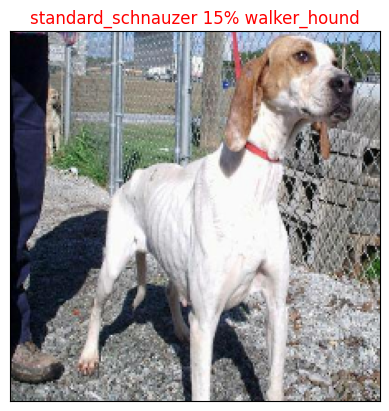

In [ ]:
plot_pred(prediction_probabilites=predictions,labels=val_labels,images=val_images,n=30
          )

 Now we've got one function to visualize to visualize our models top prediction ,let's make another to view our models top 10 predictions

 This function will:
 * Take an input of prediction probabilites array and a ground truth array and an integer ✅
 * Find the prediction using `get_pred_label()` ✅
 * Find the top 10:
    * Prediciton probabilites indexes✅
    * Prediction probabilites values✅
    * Prediction labels ✅

* Plot the top 10 prediction proability values and labels, coloring the true label green ✅

In [ ]:
def plot_pred_conf(prediction_probabilites,labels,n=1):
  """
  Plus the top 10 highest prediction confidences along with the truht label for sample n.
  """
  pred_prob,true_label=prediction_probabilites[n], labels[n]
  #Get the predicted label
  pred_label=get_pred_label(pred_prob)
  # Find the top ten prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  #Find the top ten prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  #Find the top ten prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation='vertical')
  # Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass

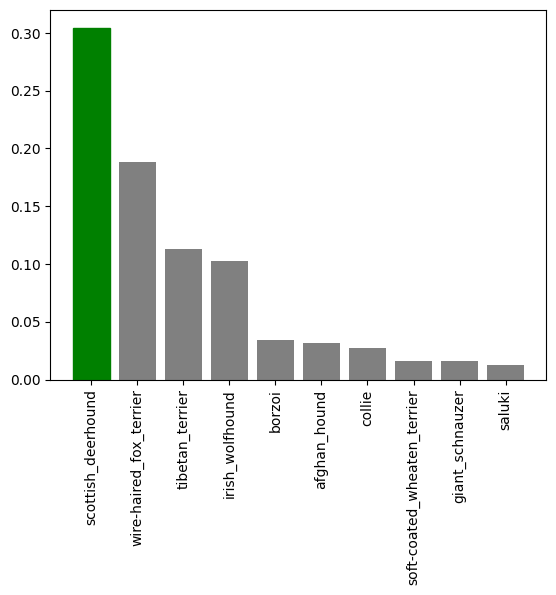

In [ ]:
plot_pred_conf(prediction_probabilites=predictions,labels=val_labels,n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle , lets check out a few

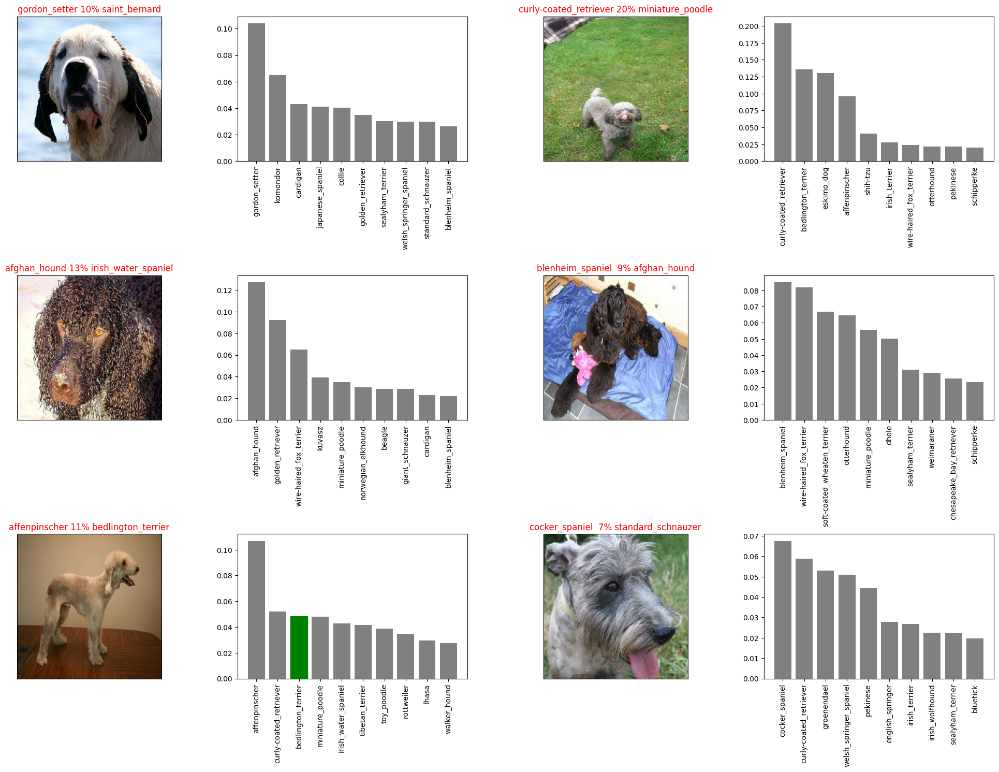

In [ ]:
# Lets check out a few predictions and their different values
i_multiplier=20
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilites=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilites=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

In [ ]:
#tf.math.confusion_matrix(labels=val_labels,predictions=predictions)

### Saving and reloading a model

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appens a suffix(string).
  """
  #Create a model directory pathname with current time
  modeldir=os.path.join('drive/My Drive/dog vision/model',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path=modeldir+'-'+suffix+'.h5' #save format of a model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f'Loading saved model from : {model_path}')
  model=tf.keras.models.load_model(model_path,custom_objects={'KerasLayer':hub.KerasLayer})
  return model

Now we've got functions to save and loasd a trained model , let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')


NameError: name 'model' is not defined

In [ ]:
#LOAD A TRIANED MODEL
loaded_1000_image_model=load_model('drive/My Drive/dog vision/model/20240131-17511706723481-1000-images-mobilenetv2-Adam.h5')

Loading saved model from : drive/My Drive/dog vision/model/20240131-17511706723481-1000-images-mobilenetv2-Adam.h5


In [ ]:
#. Evaludate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 0s 45ms/step - loss: 1.2390 - accuracy: 0.6650


[1.239029049873352, 0.6650000214576721]

In [ ]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 12s 1s/step - loss: 1.2391 - accuracy: 0.6850


[1.239132285118103, 0.6850000023841858]

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 29,  93,  37,   8, 116,  60, 111,  88, 119,  26])

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.8246057 , 0.05100469, 0.04138613, 0.02361942, 0.01025211,
       0.00889939, 0.00744764, 0.00567146, 0.0039868 , 0.00316374],
      dtype=float32)

In [ ]:
## Training the full model on the full dog data

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
len(X_train),len(y_train)

(800, 800)

In [ ]:
# Create a data batch with the full data set
full_data=create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create. a model for full model
full_model=create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1


In [ ]:
# Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
# No validation se twhen training on all the data, so we can't monitor validation accuracy
full_model_eary_stopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3)



**Note:** Running the cell below will take a little while (maybe up to 10 minutes_ because the Gpu we're using in the runtime has to load all of the images into memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_eary_stopping])

Epoch 1/100
320/320 [==============================] - 21s 53ms/step - loss: 1.3405 - accuracy: 0.6657
Epoch 2/100
320/320 [==============================] - 17s 52ms/step - loss: 0.4040 - accuracy: 0.8813
Epoch 3/100
320/320 [==============================] - 17s 52ms/step - loss: 0.2383 - accuracy: 0.9363
Epoch 4/100
320/320 [==============================] - 17s 52ms/step - loss: 0.1560 - accuracy: 0.9619
Epoch 5/100
320/320 [==============================] - 17s 53ms/step - loss: 0.1061 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 17s 52ms/step - loss: 0.0788 - accuracy: 0.9858
Epoch 7/100
320/320 [==============================] - 17s 52ms/step - loss: 0.0593 - accuracy: 0.9904
Epoch 8/100
320/320 [==============================] - 17s 52ms/step - loss: 0.0468 - accuracy: 0.9932
Epoch 9/100
320/320 [==============================] - 17s 53ms/step - loss: 0.0378 - accuracy: 0.9955
Epoch 10/100
320/320 [==============================] - 16s 51ms/step - l

In [ ]:
save_model(full_model,suffix='full-image-set-mobilenetv2-Adam')

Saving model to: drive/My Drive/dog vision/model/20240201-15361706801796-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/dog vision/model/20240201-15361706801796-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
#Load in the full model
loaded_full_model=load_model('drive/My Drive/dog vision/model/20240201-15361706801796-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from : drive/My Drive/dog vision/model/20240201-15361706801796-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format

Luckily we created `create_data_batches()` earlier which can take a list fo filenames as input and convert them into Tensor batches.

To make prediction on the test data, we`ll
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True()`(since the test data doesnt have labesl)
* Make a predictions array by passing the test batches to the `predict()` method called on our model

In [ ]:
## We first got to convert it into numbers
test_path= 'drive/My Drive/dog vision/test/'
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/dog vision/test/e647098485898391b700270c61824282.jpg',
 'drive/My Drive/dog vision/test/e587c21aedc81f89b83dd326e034e7e0.jpg',
 'drive/My Drive/dog vision/test/df8d6d05e6f83c513a4ab0077207a72a.jpg',
 'drive/My Drive/dog vision/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/My Drive/dog vision/test/df2a003a0b1a216effd806f03f703859.jpg',
 'drive/My Drive/dog vision/test/deed28298a869f87cf0372f592a21d43.jpg',
 'drive/My Drive/dog vision/test/de9fc145601771b7a5b7e68822416fb5.jpg',
 'drive/My Drive/dog vision/test/e4e991c432ce6d8e8ba26672ff8fb2f5.jpg',
 'drive/My Drive/dog vision/test/e2a6dfb8127f801af0626f245f35441e.jpg',
 'drive/My Drive/dog vision/test/e06fdea86b416e992137ad52bb5da5a8.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Notes:** calling `predict()` on our full model and passing it the test data batch will take a long time to run since its the full model

In [ ]:
#Make predictions on test data batch using the loaded full model
test_preds=loaded_full_model.predict(test_data,verbose=1)

  7/324 [..............................] - ETA: 2:06

KeyboardInterrupt: 

In [ ]:
# Save predictions (Numpy array )to csv file (for access later)
np.savetxt('drive/My Drive/dog vision/preds_array.csv',test_preds,delimiter=',')

In [ ]:
#Load predictions (Numpy array) from csv file
test_predictions=np.loadtxt('drive/My Drive/dog vision/preds_array.csv',delimiter=',')

In [ ]:
test_predictions[:10]

array([[1.00304555e-06, 2.55905757e-13, 2.59993016e-07, ...,
        1.03547609e-06, 7.20265803e-09, 2.66972311e-09],
       [3.90402839e-08, 4.08316190e-08, 6.95576485e-09, ...,
        1.28643194e-07, 3.78037015e-07, 8.32950331e-09],
       [1.22913874e-10, 3.96581584e-07, 1.20785014e-11, ...,
        6.27668620e-12, 4.79442512e-16, 1.22810410e-12],
       ...,
       [2.29086043e-04, 4.83394069e-06, 3.13084350e-08, ...,
        1.59453649e-07, 6.40351494e-10, 2.72684730e-07],
       [1.17373409e-08, 3.45387743e-05, 1.19728516e-09, ...,
        9.31246632e-07, 4.71453816e-01, 1.17361951e-05],
       [1.39692435e-12, 4.57119285e-08, 5.53157133e-06, ...,
        2.60314235e-04, 2.97497564e-07, 2.96619738e-12]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID column and a columns for each different dog breed
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format ,we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle

In [ ]:
#['id']+ list(unique_breeds)

In [ ]:
# Create a pandas DataFRame with empty columns
preds_df=pd.DataFrame(columns=['id']+list(unique_breeds))

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids=[os.path.splitext(path)[0]for path in os.listdir(test_path)]
test_ids

['e647098485898391b700270c61824282',
 'e587c21aedc81f89b83dd326e034e7e0',
 'df8d6d05e6f83c513a4ab0077207a72a',
 'e7fcdf9671a6593b638cbee42842f981',
 'df2a003a0b1a216effd806f03f703859',
 'deed28298a869f87cf0372f592a21d43',
 'de9fc145601771b7a5b7e68822416fb5',
 'e4e991c432ce6d8e8ba26672ff8fb2f5',
 'e2a6dfb8127f801af0626f245f35441e',
 'e06fdea86b416e992137ad52bb5da5a8',
 'e1f4d57ee24b11a0d1a24b83e12d6bb7',
 'e9d585ce5dc29b4e9aa6a7332ddfa983',
 'ec2a07ae6eaa64dac4154584ef229937',
 'f31ed6141b0976f85aaef9b69509c939',
 'ead86e148dabfcc4ef7f4dcdce9fcf57',
 'f195789502ac83352770c6718ba9eaa2',
 'f596d629c90c70820c38a094f03be387',
 'efd7266343c00fd2cb3cf5aec4aa0b42',
 'f3482b871bff6a7d6907f10eeac75aea',
 'f0ceb5eb780eba366f9a077486fe003d',
 'f47cd43251c741ee459c688955c41f29',
 'f5787e3574a4af6a19ff825cf0c32366',
 'f45014f665123584d3588802ee020bce',
 'eeb72cc64e4b26bf721196dfcb324e82',
 'edd5c8d96746d4af7eed0550eafd4b90',
 'ea8669c09612478bfa202ae2fa101b13',
 'ea3e496d0dd2b7c24ae8c9a0fea57060',
 

In [ ]:
preds_df['id']=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e647098485898391b700270c61824282,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e587c21aedc81f89b83dd326e034e7e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,df8d6d05e6f83c513a4ab0077207a72a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7fcdf9671a6593b638cbee42842f981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df2a003a0b1a216effd806f03f703859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilites to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e647098485898391b700270c61824282,1.003046e-06,2.559058e-13,2.599930e-07,1.208730e-09,4.124722e-06,1.551059e-11,4.023002e-12,2.262806e-09,6.218635e-08,...,7.137014e-10,7.076205e-07,2.301838e-11,6.664407e-09,2.562644e-08,9.073703e-13,6.450132e-09,1.035476e-06,7.202658e-09,2.669723e-09
1,e587c21aedc81f89b83dd326e034e7e0,3.904028e-08,4.083162e-08,6.955765e-09,3.990800e-07,5.719452e-09,6.162560e-09,1.478055e-10,6.504762e-10,3.976877e-08,...,1.162410e-04,3.127057e-09,9.034325e-07,1.540140e-08,1.780703e-06,1.316927e-11,1.774441e-10,1.286432e-07,3.780370e-07,8.329503e-09
2,df8d6d05e6f83c513a4ab0077207a72a,1.229139e-10,3.965816e-07,1.207850e-11,7.015800e-08,1.203670e-10,1.344954e-13,3.067565e-13,6.141434e-16,1.832286e-13,...,7.477295e-10,9.730671e-15,7.612767e-14,4.780314e-10,1.637229e-11,1.359142e-15,5.374809e-16,6.276686e-12,4.794425e-16,1.228104e-12
3,e7fcdf9671a6593b638cbee42842f981,2.326124e-16,1.565300e-13,1.222308e-15,8.806566e-14,4.747984e-15,5.092712e-13,5.341697e-14,7.901701e-14,9.878447e-12,...,3.115644e-16,3.900953e-16,6.349816e-17,1.023985e-12,1.329589e-16,1.000000e+00,2.429392e-13,3.993757e-13,2.719471e-14,2.473634e-17
4,df2a003a0b1a216effd806f03f703859,1.241274e-11,5.229231e-06,4.494097e-11,1.378243e-08,6.255664e-12,2.874732e-06,6.609201e-12,1.512994e-11,1.823891e-08,...,1.091548e-09,2.811077e-13,5.795193e-09,1.891637e-08,8.109232e-08,8.543229e-11,1.803542e-09,4.029553e-10,1.759530e-12,5.994311e-11


In [ ]:
# Save our predictions dataFrame to csv for submission to Kaggle
preds_df.to_csv('drive/My Drive/dog vision/full_model_predictions_submission_1_mobilenetV2.csv',index=False)

## Making predictions on custom images

To make predictions on custom images , we'll:
* Get the filepaths of our images
* Turn the filepaths into data batches using `create_data_batches()`.And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image databatch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels
* Compare the predicted labels to the custom iamges


In [ ]:
# Get custom image filepaths
custom_path= 'drive/My Drive/dog vision/my-dog-photos/'
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]


In [ ]:
custom_image_paths

['drive/My Drive/dog vision/my-dog-photos/Siberian_Husky_with_Blue_Eyes.jpg',
 'drive/My Drive/dog vision/my-dog-photos/Golden_Retriever_puppy.jpg',
 'drive/My Drive/dog vision/my-dog-photos/Sealyham_Terrier_Puppy.jpg',
 'drive/My Drive/dog vision/my-dog-photos/Irish_setter.jpg']

In [ ]:
# Turn custom images into data batch datasets
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(4, 120)

In [ ]:
# Get custom image prediction labels
custom_preds_labels=[get_pred_label(custom_preds[i])for i in range(len(custom_preds))]
custom_preds_labels

['siberian_husky', 'golden_retriever', 'sealyham_terrier', 'irish_setter']

In [ ]:
# Get custom images (out unbatchify() function wont work since there aren't labels)

custom_images=[]

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

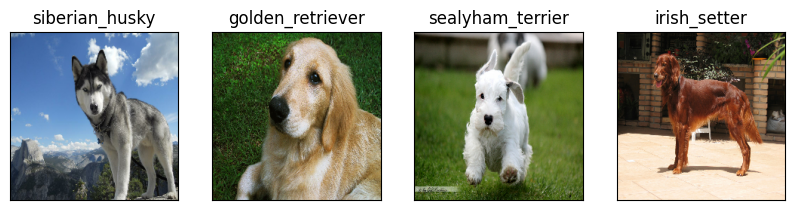

In [ ]:
#Check custom image predictions
plt.figure(figsize=(10,10))
for i ,image in enumerate(custom_images):
  plt.subplot(1,len(custom_images),i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      